In [1]:
%load_ext autoreload
%autoreload 2


import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time


In [2]:
import shutil
import os 

In [4]:
#for one file
#for all files, txt to npy

folder = "./Droso/"
image_path = os.path.join('./Droso/6603457.jpg')
gt = "./Droso/txt/6603457.txt"
os.makedirs(folder+'Train/landmarks/', exist_ok=True)
os.makedirs(folder+'Train/Images/', exist_ok=True)

landmarks_folder = os.path.join(folder, 'Train/landmarks/')
images_folder = os.path.join(folder, 'Train/Images/')

image = cv2.imread(image_path, 0)
[l, h] = image.shape

land_file=pd.read_csv('/home/hpcpin1/Seg_Project/Datasets/Cytomine/Droso/txt/6603457.txt', delimiter=' ', header=None)
landmarks_list=[]

for i in range(len(land_file)):
    x= land_file.iloc[i][0]/l*1024
    y=land_file.iloc[i][1]/h*1024
    landmarks_list.append(x)
    landmarks_list.append(y)


image = cv2.resize(image, (1024,1024))



#cv2.imwrite(os.path.join(images_folder,"6603457.jpg".replace('.jpg', '.png')), image.astype('uint8'))
#np.save(os.path.join(landmarks_folder,"6603457.jpg".replace('.jpg', '.npy')), landmarks_list)

In [5]:
## for every file, every folder

import glob
import random


for folder in ["./Droso/", "./Cephalo/", "./Zebra/"]:

    os.makedirs(folder+'Train/landmarks/', exist_ok=True)
    os.makedirs(folder+'Train/Images/', exist_ok=True)
    os.makedirs(folder+'Test/landmarks/', exist_ok=True)
    os.makedirs(folder+'Test/Images/', exist_ok=True)
    os.makedirs(folder+'Val/landmarks/', exist_ok=True)
    os.makedirs(folder+'Val/Images/', exist_ok=True)

    files_list = [f.split("/")[2] for f in glob.glob((glob.escape(folder) + "*."))]
    random.shuffle(files_list)

    train_list=files_list[0:int(len(files_list)//(1/(0.4)))]
    val_list=files_list[int(len(files_list)//(1/(0.4))):int(len(files_list)//(1/(0.4+0.1)))]
    test_list=files_listval_list=files_list[int(len(files_list)//(1/(0.4+0.1))):]

    for list in [train_list, val_list, test_list]:
        for f in list:
            image_path = os.path.join(folder, f)
            landmarks_path = os.path.join(folder, "txt", f.replace('.', '.txt'))

            if list==train_list:
                landmarks_folder = os.path.join(folder, 'Train/landmarks/')
                images_folder = os.path.join(folder, 'Train/Images/')  
            elif list==val_list:
                landmarks_folder = os.path.join(folder, 'Val/landmarks/')
                images_folder = os.path.join(folder, 'Val/Images/')  
            else: 
                landmarks_folder = os.path.join(folder, 'Test/landmarks/')
                images_folder = os.path.join(folder, 'Test/Images/')  
            


            image = cv2.imread(image_path, 0)
            [h, w] = image.shape

            print(landmarks_path)
            land_file=pd.read_csv(landmarks_path, delimiter=' ', header=None)
            landmarks_list=[]

            for i in range(len(land_file)):
                x= land_file.iloc[i][0]/w*1024
                y=land_file.iloc[i][1]/h*1024
                landmarks_list.append(x)
                landmarks_list.append(y)


            image = cv2.resize(image, (1024,1024))



            cv2.imwrite(os.path.join(images_folder,f.replace('.', '.png')), image.astype('uint8'))
            np.save(os.path.join(landmarks_folder,f.replace('.', '.npy')), landmarks_list)

./Droso/txt/6606327.txt
./Droso/txt/6609968.txt
./Droso/txt/6606662.txt
./Droso/txt/6606198.txt
./Droso/txt/6607469.txt
./Droso/txt/6608694.txt
./Droso/txt/6606461.txt
./Droso/txt/6606139.txt
./Droso/txt/6608913.txt
./Droso/txt/6611797.txt
./Droso/txt/6610748.txt
./Droso/txt/6604662.txt
./Droso/txt/6606022.txt
./Droso/txt/6613639.txt
./Droso/txt/6611654.txt
./Droso/txt/6605462.txt
./Droso/txt/6607207.txt
./Droso/txt/6606507.txt
./Droso/txt/6607886.txt
./Droso/txt/6605275.txt
./Droso/txt/6603463.txt
./Droso/txt/6603655.txt
./Droso/txt/6610092.txt
./Droso/txt/6608426.txt
./Droso/txt/6613276.txt
./Droso/txt/6609581.txt
./Droso/txt/6603649.txt
./Droso/txt/6604130.txt
./Droso/txt/6609769.txt
./Droso/txt/6612589.txt
./Droso/txt/6604486.txt
./Droso/txt/6613495.txt
./Droso/txt/6604827.txt
./Droso/txt/6608273.txt
./Droso/txt/6612032.txt
./Droso/txt/6608415.txt
./Droso/txt/6612674.txt
./Droso/txt/6612775.txt
./Droso/txt/6608045.txt
./Droso/txt/6605207.txt
./Droso/txt/6607385.txt
./Droso/txt/6611

In [46]:
test=np.load("/home/hpcpin1/Seg_Project/Datasets/Cephalometric/Train/landmarks/001.npy")
print(test)

test=np.load("/home/hpcpin1/Seg_Project/Datasets/Cytomine/Cephalo/Train/landmarks/6641948.npy")
print(test)

[441.88113695 424.96       779.51007752 439.04       682.1374677
 545.70666667 319.63617571 523.94666667 727.64857881 705.70666667
 733.46976744 861.44       705.42222222 938.66666667 668.37829457
 969.38666667 690.60465116 960.85333333 367.26408269 770.13333333
 772.63049096 797.86666667 767.33850129 795.30666667 840.36795866
 747.94666667 830.31317829 858.88       801.20723514 691.2
 731.35297158 985.6        499.56382429 642.56       759.92971576
 669.44       351.3881137  571.73333333]
[1258.         3280.27118644 2760.         3250.51815981 1898.
 3384.40677966 2760.         4961.31719128 2940.         3411.68038741
 3010.         4368.73607748 3084.         3647.2251816  2918.
 4048.89104116 2828.         3984.42615012 1434.         4108.39709443
 2618.         4941.48184019 2556.         4983.63196126 2648.
 4869.57869249 2668.         4413.36561743 2846.         3582.76029056
 1058.         3032.32929782 2486.         2690.16949153 2588.
 2040.56174334 1410.         2543.883777

In [41]:
import sys 
sys.path.append('../..')
from models.hybrid import Hybrid as Hybrid
from models.hybridSkip import Hybrid as Skip
from models.hybridDoubleSkip import Hybrid as DoubleSkip

import os 

import torch
from torchvision import transforms
import numpy as np

from utils.dataLoader import LandmarksDataset, ToTensor, Rescale
from sklearn.metrics import mean_squared_error
import scipy.sparse as sp
from utils.utils import scipy_to_torch_sparse, genMatrixesLH, genMatrixesOne

In [60]:
train_path = "/home/hpcpin1/Seg_Project/Datasets/Cytomine/Zebra/Train"



img_path = os.path.join(train_path, 'Images')
label_path = os.path.join(train_path, 'landmarks')
test_dataset = LandmarksDataset(img_path=img_path,
                                 label_path=label_path,
                                 transform = transforms.Compose([
                                             Rescale(1024),
                                             ToTensor()])
                                 )

device = 'cpu'

In [61]:
def draw_lines(ax, array, color = 'b'):
    N = array.shape[0]
    
    for i in range(0, N):
        x1, y1 = array[i-1,:]
        x2, y2 = array[i,:]
        
        ax.plot([x1, x2], [y1, y2], color=color, linestyle='-', linewidth=1)
    return

def draw_organ(ax, array, color = 'b', bigger = None):
    N = array.shape[0]
    
    for i in range(0, N):
        x, y = array[i,:]
        
        if bigger is not None:
            if i in bigger:
                circ = plt.Circle((x, y), radius=9, color=color, fill = True)
                ax.add_patch(circ)
                circ = plt.Circle((x, y), radius=3, color='white', fill = True)
            else:
                circ = plt.Circle((x, y), radius=3, color=color, fill = True)
        else:
            circ = plt.Circle((x, y), radius=3, color=color, fill = True)
            
        ax.add_patch(circ)
    return

def drawOrgans(ax, vector, title = '', img =  None):
    
    vector = vector.reshape(-1, 1)
    right_lung = vector[:19*2].reshape(-1,2)
    
    if img is not None:
        plt.imshow(img, cmap='gray')
    
    #ax.set_ylim(1024, 0)
    #ax.set_xlim(0, 1024)
    #fig.gca().set_aspect('equal', adjustable='box')
    
    draw_lines(ax, right_lung, 'r')
    
    draw_organ(ax, right_lung, 'r')

    ax.set_title(title)
    
    return

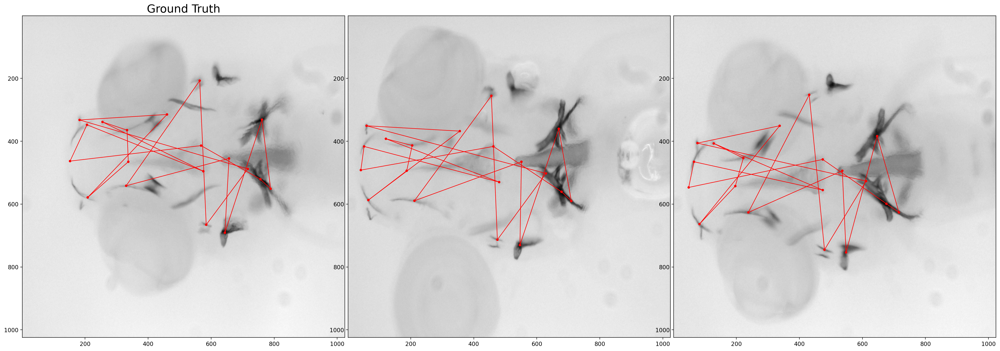

In [62]:
#from utils.fun import drawOrgans
import matplotlib.pyplot as plt

#model_list_ = [pcaNet, vae, hybrid, Skip6, double65]
#model_names_ = ['PCA', 'FC', 'HybridGNet', '1-IGSC Layer 6', '2-IGSC Layers 6-5']

i_ =[4, 13, 44]

fig = plt.figure(figsize=(24, 8), dpi= 200)

c = 0

for i in i_:
    with torch.no_grad():
        sample = test_dataset[i]

        data, target = sample['image'], sample['landmarks']
        data = torch.unsqueeze(data, 0).to(device)
        target = target.reshape(-1).numpy()

        draw = data.cpu().numpy()[0,0,:,:]
        
        ax = plt.subplot(1, 3, c+1)
        # 3, 8, 1+ c*8
        plt.axis('on')
        plt.xlim(1, 1024)
        plt.ylim(1024, 1)
        
        target = np.clip(target, 0, 1)
        if c == 0:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
            plt.title("Ground Truth", fontsize = 20)
        else:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
        
        c += 1
        
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.01, hspace=0)      

In [40]:
A, AD, D, U = genMatrixesOne(19)

A = sp.csc_matrix(A).tocoo()
AD = sp.csc_matrix(AD).tocoo()
D = sp.csc_matrix(D).tocoo()
U = sp.csc_matrix(U).tocoo()

D_ = [D.copy()]
U_ = [U.copy()]
A_ = [A.copy(), A.copy(), A.copy(), AD.copy(), AD.copy(), AD.copy()]

N1 = A.shape[0]
N2 = AD.shape[0]

config = {}
config['n_nodes'] = config['n_nodes'] = [N1, N1, N1, N2, N2, N2]

A_t, D_t, U_t = ([scipy_to_torch_sparse(x).to(device) for x in X] for X in (A_, D_, U_))

config['latents'] = 64
config['inputsize'] = 1024

f = 32
config['filters'] = [2, f, f, f, f//2, f//2, f//2]
config['skip_features'] = f

config['window'] = (3,3)

config['K'] = 6
config['l1'] = 6
config['l2'] = 5

double = DoubleSkip(config.copy(), D_t, U_t, A_t).to(device)
double.load_state_dict(torch.load("/home/hpcpin1/Seg_Project/Training/cephalo_28071330/bestMSE.pt", map_location=device))
double.eval()
print('Model loaded')

6-5
Model loaded


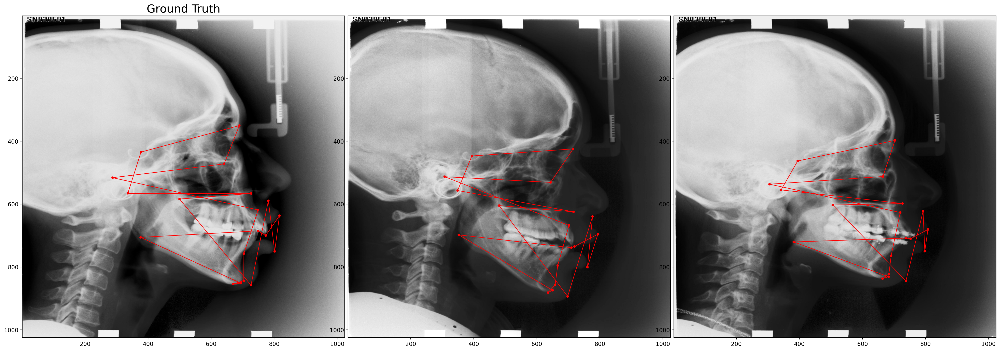

In [41]:
#from utils.fun import drawOrgans
import matplotlib.pyplot as plt

#model_list_ = [pcaNet, vae, hybrid, Skip6, double65]
#model_names_ = ['PCA', 'FC', 'HybridGNet', '1-IGSC Layer 6', '2-IGSC Layers 6-5']

i_ =[4, 13, 44]

fig = plt.figure(figsize=(24, 8), dpi= 200)

c = 0

for i in i_:
    with torch.no_grad():
        sample = test_dataset[i]

        data, target = sample['image'], sample['landmarks']
        data = torch.unsqueeze(data, 0).to(device)
        target = target.reshape(-1).numpy()

        draw = data.cpu().numpy()[0,0,:,:]
        
        ax = plt.subplot(1, 3, c+1)
        # 3, 8, 1+ c*8
        plt.axis('on')
        plt.xlim(1, 1024)
        plt.ylim(1024, 1)
        
        target = np.clip(target, 0, 1)

        output = double(data)
        if len(output) > 1:
            output = output[0]
        output = output.cpu().numpy().reshape(-1) 
        output = np.clip(output, 0, 1)[:240]

        target=output
        if c == 0:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
            plt.title("Ground Truth", fontsize = 20)
        else:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
        
        c += 1
        
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.01, hspace=0)      

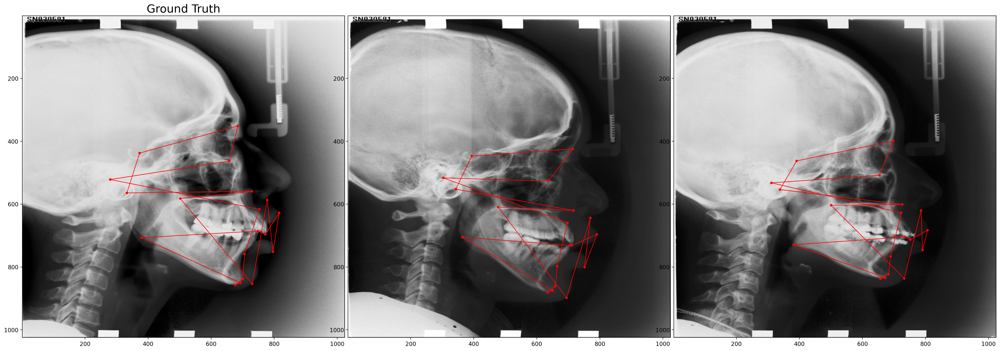

In [42]:
#from utils.fun import drawOrgans
import matplotlib.pyplot as plt

#model_list_ = [pcaNet, vae, hybrid, Skip6, double65]
#model_names_ = ['PCA', 'FC', 'HybridGNet', '1-IGSC Layer 6', '2-IGSC Layers 6-5']

i_ =[4, 13, 44]

fig = plt.figure(figsize=(24, 8), dpi= 200)

c = 0

for i in i_:
    with torch.no_grad():
        sample = test_dataset[i]

        data, target = sample['image'], sample['landmarks']
        data = torch.unsqueeze(data, 0).to(device)
        target = target.reshape(-1).numpy()

        draw = data.cpu().numpy()[0,0,:,:]
        
        ax = plt.subplot(1, 3, c+1)
        # 3, 8, 1+ c*8
        plt.axis('on')
        plt.xlim(1, 1024)
        plt.ylim(1024, 1)
        
        target = np.clip(target, 0, 1)

        if c == 0:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
            plt.title("Ground Truth", fontsize = 20)
        else:
            drawOrgans(ax, target[:38] * 1024, None, draw.copy())
        
        c += 1
        
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.01, hspace=0)      